# Pattern Recognition in temporal series for seizure crisis detection
This notebooks includes the following:
- Initial analysis and preprocessing
- Feature Extraction
- Feature Selection
- Dimensionality Reduction

In [64]:
# Import libraries
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 
import pywt

from scipy.signal import welch
from scipy.stats import skew, kurtosis, shapiro, anderson, normaltest, kstest
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

## Initial analysis and preprocessing 

In [70]:

data = pd.read_csv("data/Epileptic Seizure Recognition.csv")
data

,Unnamed,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X170,X171,X172,X173,X174,X175,X176,X177,X178,y
0,X21.V1.791,135,190,229,223,192,125,55,-9,-33,...,-17,-15,-31,-77,-103,-127,-116,-83,-51,4
1,X15.V1.924,386,382,356,331,320,315,307,272,244,...,164,150,146,152,157,156,154,143,129,1
2,X8.V1.1,-32,-39,-47,-37,-32,-36,-57,-73,-85,...,57,64,48,19,-12,-30,-35,-35,-36,5
3,X16.V1.60,-105,-101,-96,-92,-89,-95,-102,-100,-87,...,-82,-81,-80,-77,-85,-77,-72,-69,-65,5
4,X20.V1.54,-9,-65,-98,-102,-78,-48,-16,0,-21,...,4,2,-12,-32,-41,-65,-83,-89,-73,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11495,X22.V1.114,-22,-22,-23,-26,-36,-42,-45,-42,-45,...,15,16,12,5,-1,-18,-37,-47,-48,2
11496,X19.V1.354,-47,-11,28,77,141,211,246,240,193,...,-65,-33,-7,14,27,48,77,117,170,1
11497,X8.V1.28,14,6,-13,-16,10,26,27,-9,4,...,-65,-48,-61,-62,-67,-30,-2,-1,-8,5
11498,X10.V1.932,-40,-25,-9,-12,-2,12,7,19,22,...,121,135,148,143,116,86,68,59,55,3


In [71]:
data.drop('Unnamed', axis=1, inplace=True)

Ensure there are no missing values in the dataset.

In [77]:
data.any().isna().any()

False

We are performing a binary classification task. Seizure crisis are positive classes and series not corresponding to seizure crisis will be considered negative classes. 

In [72]:
class_relabeling = {1:1, 2:0, 3:0, 4:0, 5:0}
data.replace({'y': class_relabeling}, inplace=True)

<Axes: xlabel='y'>

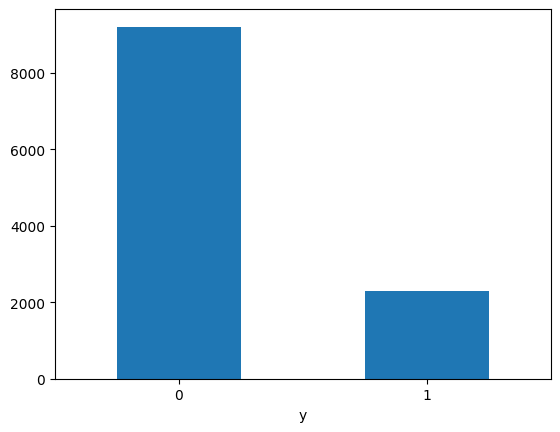

In [73]:
data["y"].value_counts().plot(kind="bar",rot=0) # inbalanced class problem

Checking few random samples from each class to visualize how is the brain activity signal different in class.

In [74]:
positive_samples = data[data["y"]==1].sample(5)
negative_samples = data[data["y"]==0].sample(5)

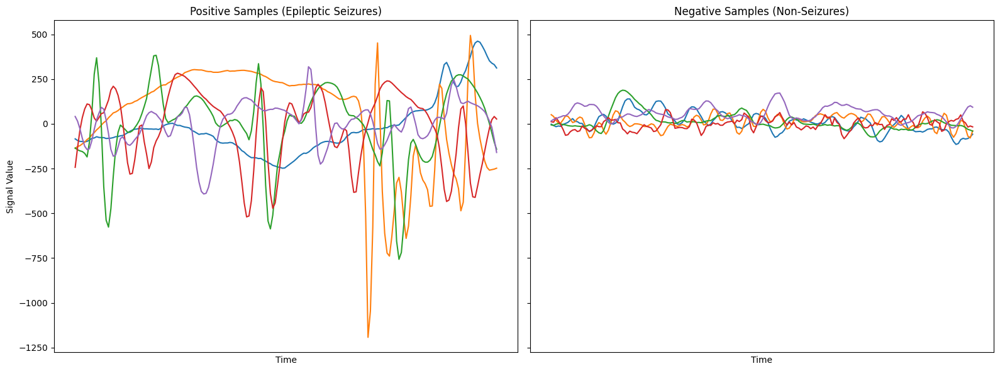

In [75]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

axes[0].plot(positive_samples.drop(columns='y').T)
axes[0].set_title('Positive Samples (Epileptic Seizures)')
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Signal Value')
axes[0].set_xticks([])  # Remove x-axis labels for clarity

axes[1].plot(negative_samples.drop(columns='y').T)
axes[1].set_title('Negative Samples (Non-Seizures)')
axes[1].set_xlabel('Time')
axes[1].set_xticks([])

plt.tight_layout()
plt.show()

Note that temporal series from non-seizure examples seem more stable and less variant than positive samples. This hints that features describing the series' variance, for example, might be helpful for the model.

## Feature Extraction

In [78]:
# Example: Assume df is your DataFrame with columns X1, X2, ..., X178
# For demonstration, let's create a dummy DataFrame:
# df = pd.DataFrame(np.random.randn(100, 178), columns=[f'X{i}' for i in range(1, 179)])

def extract_features(row, fs=178):
    """
    Extract features from a single EEG segment (a row with 178 timepoints).
    
    Parameters:
    - row: pd.Series, one row from the DataFrame containing EEG timepoints.
    - fs: float, sampling frequency of the EEG signal.
    
    Returns:
    - pd.Series with extracted features.
    """
    signal = row.values.astype(float)  # ensure signal is numeric
    features = {}

    # -- Time-Domain Features --
    features['mean'] = np.mean(signal)
    features['std'] = np.std(signal)
    features['var'] = np.var(signal)
    features['min'] = np.min(signal)
    features['max'] = np.max(signal)
    features['skew'] = skew(signal)
    features['kurtosis'] = kurtosis(signal)
    features['rms'] = np.sqrt(np.mean(signal**2))
    
    # Count zero-crossings
    zero_crossings = np.where(np.diff(np.signbit(signal)))[0]
    features['zero_crossings'] = len(zero_crossings)

    # --- Frequency-Domain Features ---
    # Compute Power Spectral Density using Welch's method.
    # The frequency resolution depends on the length of the segment.
    freqs, psd = welch(signal, fs=fs, nperseg=len(signal))
    
    # Helper function to compute band power using integration.
    def bandpower(psd, freqs, fmin, fmax):
        idx = np.logical_and(freqs >= fmin, freqs <= fmax)
        return np.trapz(psd[idx], freqs[idx])
    
    # Define typical EEG frequency bands (Hz)
    features['delta_power'] = bandpower(psd, freqs, 0.5, 4)
    features['theta_power'] = bandpower(psd, freqs, 4, 8)
    features['alpha_power'] = bandpower(psd, freqs, 8, 13)
    features['beta_power']  = bandpower(psd, freqs, 13, 30)
    # For gamma, use the remaining range up to the Nyquist frequency.
    features['gamma_power'] = bandpower(psd, freqs, 30, fs/2)
    
    # Optionally, you can also compute spectral entropy, etc.
    # (For brevity, only band power is shown here.)
    
    # === Wavelet Transform Features ===
    # Decompose the signal using the Discrete Wavelet Transform.
    # 'db4' is a commonly used wavelet for EEG.
    coeffs = pywt.wavedec(signal, 'db4', level=4)
    # For each level, compute the energy (sum of squares of coefficients)
    for i, coeff in enumerate(coeffs):
        features[f'wavelet_energy_level_{i}'] = np.sum(np.square(coeff))
    
    # === Non-Linear Features: Approximate Entropy ===
    # A simple implementation of approximate entropy.
    def approximate_entropy(U, m, r):
        """
        Compute approximate entropy of a time series U.
        m: embedding dimension
        r: tolerance (typically 0.2 * std(U))
        """
        N = len(U)
        def _phi(m):
            x = np.array([U[i:i + m] for i in range(N - m + 1)])
            C = np.sum(
                np.max(np.abs(x[:, None] - x[None, :]), axis=2) <= r, axis=0
            ) / (N - m + 1)
            # Avoid log(0) by replacing zeros with a very small number.
            C[C == 0] = 1e-10
            return np.sum(np.log(C)) / (N - m + 1)
        return _phi(m) - _phi(m + 1)
    
    r = 0.2 * np.std(signal)  # tolerance parameter
    try:
        features['approx_entropy'] = approximate_entropy(signal, m=2, r=r)
    except Exception as e:
        features['approx_entropy'] = np.nan

    return pd.Series(features)

# Apply the feature extraction to each row in the DataFrame.
# This will create a new DataFrame with the extracted features.
features_df = data.apply(extract_features, axis=1)

# Optionally, you can merge the features with the original DataFrame if desired:
df_features = pd.concat([data, features_df], axis=1)

# Display the first few rows of the features DataFrame.
df_features.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,theta_power,alpha_power,beta_power,gamma_power,wavelet_energy_level_0,wavelet_energy_level_1,wavelet_energy_level_2,wavelet_energy_level_3,wavelet_energy_level_4,approx_entropy
0,135,190,229,223,192,125,55,-9,-33,-38,...,105.327729,2948.694780,2653.396974,80.081797,3.596485e+06,1.867207e+05,7.157411e+05,1.070040e+05,8213.136792,0.669715
1,386,382,356,331,320,315,307,272,244,232,...,45283.924880,18219.181672,26169.577891,482.528134,2.958226e+07,1.166640e+07,6.581419e+06,2.282566e+06,84715.592340,0.321523
2,-32,-39,-47,-37,-32,-36,-57,-73,-85,-94,...,245.200586,245.623658,439.611408,12.302209,5.899986e+05,9.438992e+04,1.237011e+05,1.863269e+04,2602.046039,0.765979
3,-105,-101,-96,-92,-89,-95,-102,-100,-87,-79,...,21.532643,50.400049,58.233944,6.080810,1.631644e+06,1.940201e+04,1.635667e+04,2.854275e+03,3736.622992,0.875508
4,-9,-65,-98,-102,-78,-48,-16,0,-21,-59,...,90.385379,90.897728,297.336625,27.264700,5.020499e+05,6.209290e+04,7.843479e+04,4.046460e+04,5832.606612,0.688882


In [79]:
# sns.scatterplot(data=data, x="var", y="std", hue="y")
#sns.pairplot(data=data[], hue="y")

feature_cols = features_df.columns
# sns.pairplot(df_features[feature_cols], hue="y")
feature_cols

Index(['mean', 'std', 'var', 'min', 'max', 'skew', 'kurtosis', 'rms',
       'zero_crossings', 'delta_power', 'theta_power', 'alpha_power',
       'beta_power', 'gamma_power', 'wavelet_energy_level_0',
       'wavelet_energy_level_1', 'wavelet_energy_level_2',
       'wavelet_energy_level_3', 'wavelet_energy_level_4', 'approx_entropy'],
      dtype='object')

Maybe check for ouliers in features before next steps?

## Feature Selection

Before feature selection, check if the distribution of features is normal. If it isn't we can simply use Fisher (Razón discriminante de Fisher) to evaluate each feature's individual capability for separating both classes.

In [80]:
def test_normality(data, feature_name):
    print(f"\nTest results for: {feature_name}")

    # Test Shapiro-Wilk
    stat, p = shapiro(data)
    print(f"Shapiro-Wilk: Stat={stat:.4f}, p-value={p:.4f} {'(Not Normal)' if p < 0.05 else '(Normal)'}")

    # Test Kolmogorov-Smirnov
    ks_stat, ks_p = kstest(data, 'norm', args=(np.mean(data), np.std(data)))
    print(f"Kolmogorov-Smirnov: Stat={ks_stat:.4f}, p-value={ks_p:.4f} {'(Not Normal)' if ks_p < 0.05 else '(Normal)'}")

    # Test Anderson-Darling
    anderson_result = anderson(data, dist='norm')
    print(f"Anderson-Darling: Stat={anderson_result.statistic:.4f}")
    for i, critical in enumerate(anderson_result.critical_values):
        sig_lvl = anderson_result.significance_level[i]
        print(f"\tSignificance level {sig_lvl}%: threshold={critical:.4f} {'(Not Normal)' if anderson_result.statistic > critical else '(Normal)'}")

    # Test D'Agostino-Pearson
    dag_stat, dag_p = normaltest(data)
    print(f"D'Agostino-Pearson: Stat={dag_stat:.4f}, p-value={dag_p:.4f} {'(Not Normal)' if dag_p < 0.05 else '(Normal)'}")

for column in df_features[feature_cols].columns:
    test_normality(df_features[column], column)


Test results for: mean
Shapiro-Wilk: Stat=0.9770, p-value=0.0000 (Not Normal)
Kolmogorov-Smirnov: Stat=0.0520, p-value=0.0000 (Not Normal)
Anderson-Darling: Stat=62.3412
	Significance level 15.0%: threshold=0.5760 (Not Normal)
	Significance level 10.0%: threshold=0.6560 (Not Normal)
	Significance level 5.0%: threshold=0.7870 (Not Normal)
	Significance level 2.5%: threshold=0.9180 (Not Normal)
	Significance level 1.0%: threshold=1.0920 (Not Normal)
D'Agostino-Pearson: Stat=674.4772, p-value=0.0000 (Not Normal)

Test results for: std
Shapiro-Wilk: Stat=0.6224, p-value=0.0000 (Not Normal)
Kolmogorov-Smirnov: Stat=0.2901, p-value=0.0000 (Not Normal)
Anderson-Darling: Stat=1692.7982
	Significance level 15.0%: threshold=0.5760 (Not Normal)
	Significance level 10.0%: threshold=0.6560 (Not Normal)
	Significance level 5.0%: threshold=0.7870 (Not Normal)
	Significance level 2.5%: threshold=0.9180 (Not Normal)
	Significance level 1.0%: threshold=1.0920 (Not Normal)
D'Agostino-Pearson: Stat=5474.

C:\Users\rjvil\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11500.
  res = hypotest_fun_out(*samples, **kwds)


Kolmogorov-Smirnov: Stat=0.3739, p-value=0.0000 (Not Normal)
Anderson-Darling: Stat=2745.8424
	Significance level 15.0%: threshold=0.5760 (Not Normal)
	Significance level 10.0%: threshold=0.6560 (Not Normal)
	Significance level 5.0%: threshold=0.7870 (Not Normal)
	Significance level 2.5%: threshold=0.9180 (Not Normal)
	Significance level 1.0%: threshold=1.0920 (Not Normal)
D'Agostino-Pearson: Stat=11280.1054, p-value=0.0000 (Not Normal)

Test results for: wavelet_energy_level_2
Shapiro-Wilk: Stat=0.3112, p-value=0.0000 (Not Normal)
Kolmogorov-Smirnov: Stat=0.3851, p-value=0.0000 (Not Normal)
Anderson-Darling: Stat=2981.3318
	Significance level 15.0%: threshold=0.5760 (Not Normal)
	Significance level 10.0%: threshold=0.6560 (Not Normal)
	Significance level 5.0%: threshold=0.7870 (Not Normal)
	Significance level 2.5%: threshold=0.9180 (Not Normal)
	Significance level 1.0%: threshold=1.0920 (Not Normal)
D'Agostino-Pearson: Stat=12577.8214, p-value=0.0000 (Not Normal)

Test results for: wa

- Shapiro-Wilk: Funciona bien con muestras pequeñas (<2000 observaciones), pero puede fallar con muestras grandes.
- Kolmogorov-Smirnov (KS): Se basa en la distancia entre la CDF muestral y la CDF teórica. Funciona bien pero es sensible a valores extremos.
- Anderson-Darling: Similar a KS, pero da valores críticos para interpretar el resultado sin necesidad de un p-valor.
- D’Agostino-Pearson: Evalúa normalidad considerando asimetría (skewness) y curtosis. Es más robusto con muestras grandes.

In [84]:
# scale data

scaler = StandardScaler()
scaled_features = pd.DataFrame(scaler.fit_transform(features_df), columns=feature_cols)
scaled_features

,mean,std,var,min,max,skew,kurtosis,rms,zero_crossings,delta_power,theta_power,alpha_power,beta_power,gamma_power,wavelet_energy_level_0,wavelet_energy_level_1,wavelet_energy_level_2,wavelet_energy_level_3,wavelet_energy_level_4,approx_entropy
0,-0.280888,-0.047685,-0.255459,-0.099203,0.022276,-0.308672,0.057720,-0.094574,1.188817,-0.160811,-0.289042,-0.067824,-0.105569,-0.091275,-0.026087,-0.300006,-0.127139,-0.144590,-0.203768,0.322716
1,1.095553,2.955591,2.978397,-4.509530,1.020189,-2.570796,1.152066,2.941774,-0.957862,7.582795,1.713053,1.257864,1.001174,0.828523,2.313655,2.113342,1.227078,2.114277,0.410414,-1.893683
2,-1.110359,-0.458191,-0.364515,0.377173,-0.501277,0.872618,-0.237472,-0.376022,-0.287025,-0.286107,-0.282843,-0.302487,-0.209757,-0.246186,-0.296790,-0.319416,-0.263824,-0.236345,-0.248815,0.935477
3,-1.870450,-0.678357,-0.390014,0.441715,-0.782379,1.149773,1.019184,-0.308604,-1.897034,-0.298668,-0.292755,-0.319435,-0.227705,-0.260405,-0.203000,-0.335181,-0.288607,-0.252728,-0.239706,1.632683
4,0.032697,-0.503008,-0.371573,0.447861,-0.508304,-0.762653,-0.214678,-0.563052,2.396324,-0.290121,-0.289704,-0.315920,-0.216453,-0.211989,-0.304708,-0.326206,-0.274275,-0.213677,-0.222879,0.444721
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11495,0.393680,-0.506407,-0.372069,0.521623,-0.525873,-0.274160,-0.831875,-0.568277,-0.823695,-0.279690,-0.279267,-0.321684,-0.229935,-0.263938,-0.325192,-0.328637,-0.290458,-0.252378,-0.253243,-0.069453
11496,0.409651,0.490172,0.008625,-0.428057,0.872611,0.059538,0.449886,0.439011,-0.555360,-0.196508,0.027001,-0.082933,-0.136215,-0.191486,-0.240154,0.797363,-0.233304,-0.189675,-0.039862,-1.029923
11497,0.442452,-0.459318,-0.364704,0.487816,-0.357212,0.206875,-0.353005,-0.519243,1.457152,-0.276797,-0.292664,-0.313089,-0.204105,-0.004717,-0.330861,-0.335465,-0.273391,-0.212084,-0.190586,1.913484
11498,-0.951334,-0.304994,-0.333182,0.281898,-0.262340,0.923402,0.216761,-0.279082,-0.823695,-0.270228,-0.279879,-0.282356,-0.222361,-0.239375,-0.276181,-0.310821,-0.279381,-0.243282,-0.236867,-0.071803


In [85]:
def fisher_ratio(feature, labels):
    classes = np.unique(labels)
    if len(classes) != 2:
        raise ValueError("This method can only be used for binary classification but more than 2 classes were provided.")

    mu1, mu2 = scaled_features[feature][labels == classes[0]].mean(), scaled_features[feature][labels == classes[1]].mean()
    sigma1, sigma2 = scaled_features[feature][labels == classes[0]].var(), scaled_features[feature][labels == classes[1]].var()

    return (mu1 - mu2)**2 / (sigma1 + sigma2)

fdr_scores = {col: fisher_ratio(col, data["y"]) for col in scaled_features.columns}
sorted_fdr_scores = dict(sorted(fdr_scores.items(), key=lambda item: item[1], reverse=True))
sorted_fdr_scores

{'std': 2.5790154038310393,
 'rms': 2.4947949627515196,
 'max': 2.14643243506273,
 'min': 1.6644936256706653,
 'approx_entropy': 1.4434363010830942,
 'var': 1.073280561594114,
 'wavelet_energy_level_1': 0.7437933505295283,
 'theta_power': 0.545979732894485,
 'wavelet_energy_level_0': 0.5353939096475024,
 'alpha_power': 0.5008255993490575,
 'wavelet_energy_level_2': 0.48791810798443236,
 'delta_power': 0.3615995754957109,
 'wavelet_energy_level_3': 0.34540533174825266,
 'wavelet_energy_level_4': 0.3158024886511365,
 'gamma_power': 0.30384859123819613,
 'beta_power': 0.28683825024050813,
 'kurtosis': 0.02758386213704085,
 'mean': 0.005561424021443865,
 'skew': 0.005080974116686522,
 'zero_crossings': 0.003868800716993915}

Features such as the standard deviation of the series or its maximum value have a powerful discriminative power, while other features like mean or zero crossings don't help separate classes at all. Before further analysis and dmensionllity reduction we willl get rid of non useful features.

In [98]:
selected_features = [col for col in fdr_scores if fdr_scores[col] > 0.05]

scaled_features = scaled_features[selected_features] # make sure you remove non significant features according to fisher criterion

We can also visualize separability of classes by feature pairs. At first glance we can observe some potentially good pairs of features but we will need more than one feature to perform a good classificatoin.

In [99]:
scaled_features_labelled = scaled_features.copy()
scaled_features_labelled["y"] = data["y"]

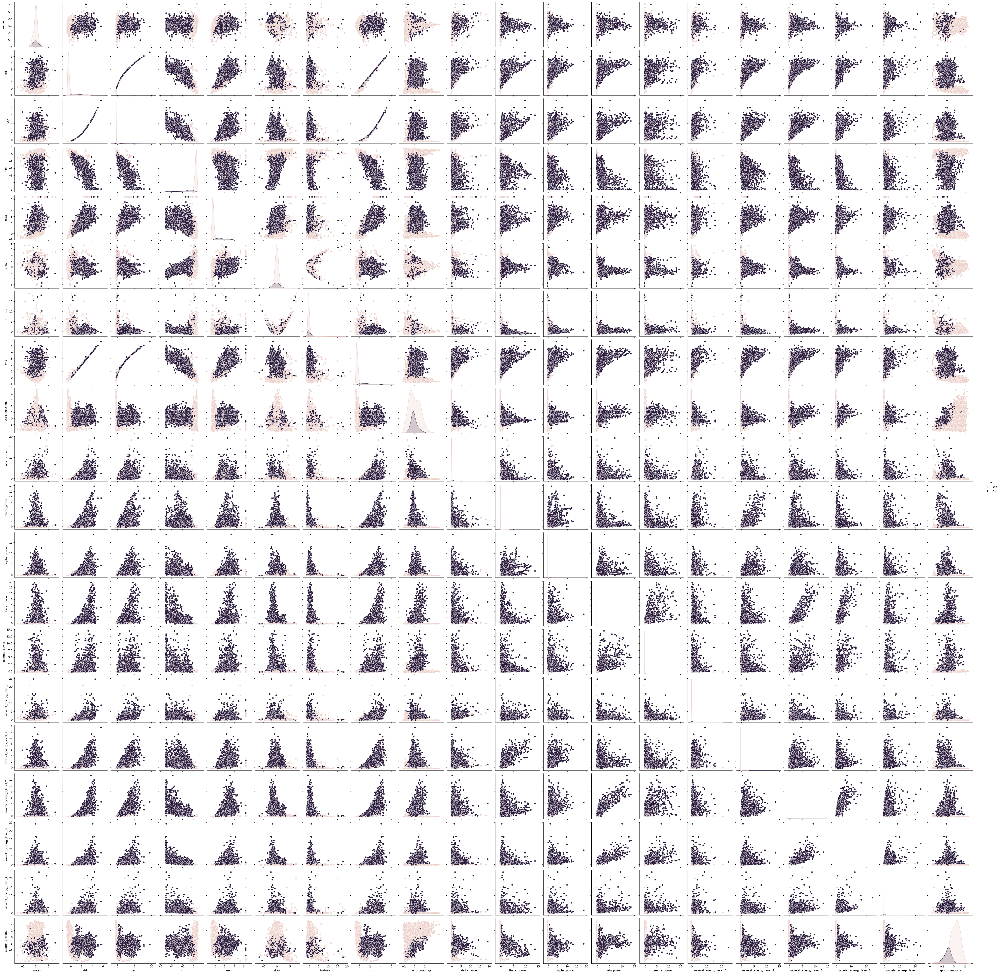

In [ ]:
# normalize pairplot
sns.pairplot(scaled_features_labelled, hue="y")

## Feature Selection (groups)

The main objective here is to select the best subset of features, taking into account mutual correlations among them and class separability. (Este código calcula la matriz de varianza intra-clase e inter-clase como criterio para evaluar la separabilidad de las clases).

In [116]:
def criterio_separabilidad(features, labels):

    features_labelled = features.copy()
    features_labelled["y"] = labels

    # Calcular matriz de dispersión intra-clase Sw
    Sw = np.zeros((features.shape[1], features.shape[1]))
    Sb = np.zeros((features.shape[1], features.shape[1]))

    mu_total = features.mean().values.reshape(-1, 1)

    for clase in labels.unique():
        df_clase = features_labelled[features_labelled['y'] == clase].drop(columns="y") # quitamos la etiqueta para el cálculo de las medias
        mu_clase = df_clase.mean().values.reshape(-1, 1)
        
        # Matriz intra-clase
        Sw += np.cov(df_clase, rowvar=False) * len(df_clase)
        
        # Matriz inter-clase
        diff = mu_clase - mu_total
        Sb += len(df_clase) * (diff @ diff.T)

    # Criterio de separabilidad J1
    J1 = np.trace(Sb) / np.trace(Sw)
    return J1


print(f"Criterio J1: {criterio_separabilidad(scaled_features,data["y"])}") # medida de la separabilidad de clases con este conjunto


Criterio J1: 0.5433142200733039


- Values close to 0: Classes are not very separable with this feature set.
- Values higher than 1: Classes are begginning to separate.
- Values higher or close to 10: Classes are clearly separated.

With this feature set we obtain a value of 0.543 which is not very high, so we might need to perform a finer selection. Later we can evaluate the separability on different feature subsets.

One way to improve separability is removing redundant features such as highly correlated features. For instance, variance and standard deviation are extremely correlated since one can be obtained as a function of the other. Although they both have strong discriminative potential, adding redundant information to the model is very likely to decrease performance.

In [106]:
correlation_matrix = scaled_features.corr()
correlation_matrix.style.background_gradient(cmap='coolwarm')

,std,var,min,max,rms,delta_power,theta_power,alpha_power,beta_power,gamma_power,wavelet_energy_level_0,wavelet_energy_level_1,wavelet_energy_level_2,wavelet_energy_level_3,wavelet_energy_level_4,approx_entropy
std,1.000000,0.957947,-0.935849,0.920563,0.995765,0.652145,0.726118,0.746406,0.658609,0.608340,0.746802,0.825775,0.784744,0.684103,0.617410,-0.542946
var,0.957947,1.000000,-0.915351,0.854262,0.956350,0.659504,0.744412,0.771990,0.725367,0.634517,0.763202,0.851281,0.847951,0.740512,0.641932,-0.426981
min,-0.935849,-0.915351,1.000000,-0.789309,-0.935620,-0.636144,-0.603820,-0.729849,-0.728264,-0.670627,-0.688099,-0.738529,-0.828413,-0.755670,-0.618910,0.463393
max,0.920563,0.854262,-0.789309,1.000000,0.913125,0.583873,0.622035,0.679683,0.576574,0.558234,0.668729,0.727747,0.689446,0.610387,0.565301,-0.530055
rms,0.995765,0.956350,-0.935620,0.913125,1.000000,0.653039,0.723316,0.743739,0.657720,0.607304,0.750045,0.822770,0.783199,0.682821,0.617213,-0.535363
delta_power,0.652145,0.659504,-0.636144,0.583873,0.653039,1.000000,0.284760,0.367862,0.405754,0.362342,0.621250,0.380164,0.437342,0.399774,0.396514,-0.340955
theta_power,0.726118,0.744412,-0.603820,0.622035,0.723316,0.284760,1.000000,0.604278,0.305029,0.308660,0.562629,0.883461,0.474191,0.342671,0.411115,-0.374862
alpha_power,0.746406,0.771990,-0.729849,0.679683,0.743739,0.367862,0.604278,1.000000,0.497740,0.459562,0.515250,0.762103,0.674976,0.548315,0.475326,-0.324507
beta_power,0.658609,0.725367,-0.728264,0.576574,0.657720,0.405754,0.305029,0.497740,1.000000,0.758550,0.425628,0.452040,0.921172,0.903474,0.558890,-0.194959
gamma_power,0.608340,0.634517,-0.670627,0.558234,0.607304,0.362342,0.308660,0.459562,0.758550,1.000000,0.385984,0.429539,0.734038,0.770405,0.506769,-0.175326


In [111]:
# check for high values in the correlation matrix correlation_matrix
# high values are higher than 0.9

def remove_highcor_features(df, corr_threshold=0.9):
    corr_matrix = df.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    to_remove = set()
    for column in upper.columns:
        for row in upper.index:
            if upper.at[row, column] > corr_threshold:
                if sorted_fdr_scores[row] > sorted_fdr_scores[column]:
                    to_remove.add(column)
                else:
                    to_remove.add(row)
    
    return df.drop(columns=to_remove)

corr_filtered_features = remove_highcor_features(scaled_features, corr_threshold=0.9)
corr_filtered_features.corr().style.background_gradient(cmap='coolwarm')

,std,delta_power,theta_power,alpha_power,gamma_power,wavelet_energy_level_0,wavelet_energy_level_1,wavelet_energy_level_2,wavelet_energy_level_3,wavelet_energy_level_4,approx_entropy
std,1.000000,0.652145,0.726118,0.746406,0.608340,0.746802,0.825775,0.784744,0.684103,0.617410,-0.542946
delta_power,0.652145,1.000000,0.284760,0.367862,0.362342,0.621250,0.380164,0.437342,0.399774,0.396514,-0.340955
theta_power,0.726118,0.284760,1.000000,0.604278,0.308660,0.562629,0.883461,0.474191,0.342671,0.411115,-0.374862
alpha_power,0.746406,0.367862,0.604278,1.000000,0.459562,0.515250,0.762103,0.674976,0.548315,0.475326,-0.324507
gamma_power,0.608340,0.362342,0.308660,0.459562,1.000000,0.385984,0.429539,0.734038,0.770405,0.506769,-0.175326
wavelet_energy_level_0,0.746802,0.621250,0.562629,0.515250,0.385984,1.000000,0.594194,0.521355,0.465943,0.517020,-0.383266
wavelet_energy_level_1,0.825775,0.380164,0.883461,0.762103,0.429539,0.594194,1.000000,0.623291,0.488773,0.499150,-0.389000
wavelet_energy_level_2,0.784744,0.437342,0.474191,0.674976,0.734038,0.521355,0.623291,1.000000,0.879895,0.614119,-0.271025
wavelet_energy_level_3,0.684103,0.399774,0.342671,0.548315,0.770405,0.465943,0.488773,0.879895,1.000000,0.629069,-0.227532
wavelet_energy_level_4,0.617410,0.396514,0.411115,0.475326,0.506769,0.517020,0.499150,0.614119,0.629069,1.000000,-0.249729


In [ ]:
print(f"Criterio J1: {criterio_separabilidad(corr_filtered_features, data["y"])}")

Criterio J1: 0.4184254883223189


Al parecer este criterio se carga variables que son importantes para la separabilidad, aunque haya mucha correlación entre ellas xd

A better approach: use forward or backward feature selection algorithms:

In [133]:
# TARDA UN HUEVO: 10 MINS APROX
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.svm import SVC

model = SVC()

# todavía no entiendo exactamente cómo hace la selcción, hay que estudiárselo un poco
# Seleccionar parsimonious para que devuelva el set lo más pequeño posible que obtiene un buen score (priorizamos reducir la dimensionalidad)
sfs = SFS(model, k_features="parsimonious", forward=True, floating=True, scoring='f1') # probablemente al ser clases desbalanceadas deberíamos usar otra métrica que no sea accuracy
sfs.fit(scaled_features, data["y"])

print(f"Selección final: {sfs.k_feature_names_}")


Selección final: ('std', 'min', 'delta_power', 'theta_power', 'alpha_power', 'beta_power', 'gamma_power', 'wavelet_energy_level_1', 'approx_entropy')


In [135]:
criterio_separabilidad(scaled_features[list(sfs.k_feature_names_)],data["y"]) # bruh

0.5044130942813775

## Reducción de dimensionalidad (PCA, LDA)

- aquí podríamos meter una gráfica mostrando cómo empeoran los resultados de los modelos cuanto más aumentamos la dimensionalidad (curse of dimensionality)?

## Evaluation

In [ ]:
# evaluar varios clasificadores con diferentes subsets de características y métodos para reducir la dimensionalidad
# 